In [1]:
import os
import sys
import numpy as np
import re
import cv2

import matplotlib.pyplot as plt
import tensorflow as tf
from os import listdir
from tensorflow.keras.layers import *
from time import time
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.losses import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import Model
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras import constraints
from tensorflow.keras.callbacks import *
from tensorflow.keras.applications.xception import Xception

C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Image 1 shape: (1024, 1024, 3)
Image 2 shape: (1024, 1024, 3)
Label shape: (1024, 1024)


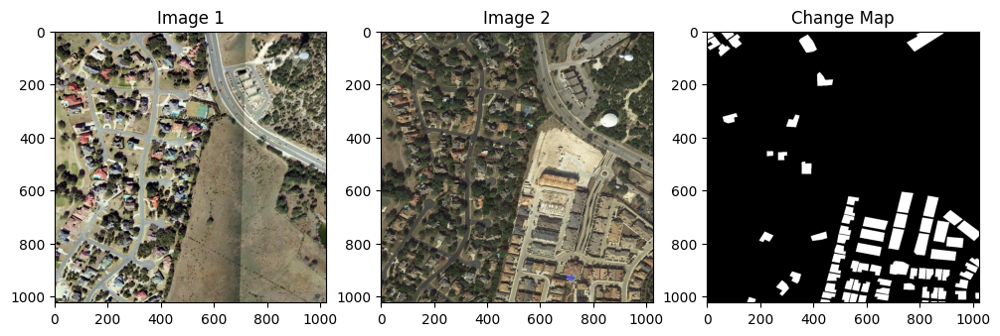

In [2]:
path = "D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD"
image1 = cv2.imread(os.path.join(path, 'train/A/train_100.png'))
image2 = cv2.imread(os.path.join(path, 'train/B/train_100.png'))
label = cv2.imread(os.path.join(path, 'train/label/train_100.png'), 0)
print("Image 1 shape:", image1.shape)
print("Image 2 shape:", image2.shape )
print("Label shape:", label.shape)
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)); plt.title('Image 1')
plt.subplot(1,3,2); plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)); plt.title('Image 2')
plt.subplot(1,3,3); plt.imshow(label, cmap='gray'); plt.title('Change Map')
plt.show()


In [ ]:

import os
import glob
import math
from typing import List, Tuple

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers as L

class CFG:
    T1_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\train\A_resized"
    T2_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\train\B_resized"
    GT_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\train\label_resized"

    VAL_T1_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\val\A_resized"
    VAL_T2_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\val\B_resized"
    VAL_GT_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\val\label_resized"
    
    TEST_T1_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\test\A_resized"
    TEST_T2_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\test\B_resized"
    TEST_GT_DIR = r"D:\SujanD datasets\datasets\mdrifaturrahman33\levir-cd\versions\1\LEVIR CD\test\label_resized"


    OUT_DIR = "./seifnet_runs"
    os.makedirs(OUT_DIR, exist_ok=True)

    TILE_SIZE = 512  
    PATCH = 512       
    STRIDE = 256      
    N_CLASSES = 1     
    CHANNELS = 3

    BATCH = 8
    EPOCHS = 200
    INIT_LR = 1e-4
    WEIGHT_DECAY = 1e-2
    BETA_1 = 0.99  
    BETA_2 = 0.999

    LAMBDA = 0.75
    SEED = 42
    THRESH = 0.5

np.random.seed(CFG.SEED)
tf.random.set_seed(CFG.SEED)

def sorted_files(root: str) -> List[str]:
    exts = ("*.png", "*.jpg", "*.jpeg", "*.tif", "*.tiff", "*.bmp")
    files = []
    for e in exts:
        files.extend(glob.glob(os.path.join(root, e)))
    files = sorted(files)
    return files


def sanity_check_lists(a: List[str], b: List[str], c: List[str]):
    assert len(a) == len(b) == len(c), f"List lengths differ: {len(a)}, {len(b)}, {len(c)}"
    for x, y, z in zip(a, b, c):
        bx = os.path.splitext(os.path.basename(x))[0]
        by = os.path.splitext(os.path.basename(y))[0]
        bz = os.path.splitext(os.path.basename(z))[0]
        if bx != by or bx != bz:
            print(f"[WARN] Name mismatch: {bx} vs {by} vs {bz}")

def _decode_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=CFG.CHANNELS, expand_animations=False)
    img.set_shape([None, None, CFG.CHANNELS])
    img = tf.image.convert_image_dtype(img, tf.float32)  
    return img


def _decode_mask(path):
    m = tf.io.read_file(path)
    m = tf.image.decode_image(m, channels=0, expand_animations=False)
    m = tf.image.convert_image_dtype(m, tf.float32)
    if tf.rank(m) == 2:
        m = tf.expand_dims(m, -1)
    m = tf.cond(tf.shape(m)[-1] == 1,
                lambda: m,
                lambda: tf.reduce_mean(m, axis=-1, keepdims=True))
    m = tf.where(m > 0.5, 1.0, 0.0)
    return m


def _extract_patches(img, patch=CFG.PATCH, stride=CFG.STRIDE):
    img = tf.expand_dims(img, 0)
    ksizes = [1, patch, patch, 1]
    strides = [1, stride, stride, 1]
    rates = [1, 1, 1, 1]
    patches = tf.image.extract_patches(img, ksizes, strides, rates, padding='VALID')
    h = tf.shape(img)[1] // patch
    w = tf.shape(img)[2] // patch
    c = tf.shape(img)[3]
    patches = tf.reshape(patches, (1, h, w, patch, patch, c))
    patches = tf.reshape(patches, (h*w, patch, patch, c))
    return patches

def pairs_generator(t1_list, t2_list, gt_list):
    for p1, p2, pm in zip(t1_list, t2_list, gt_list):
        x1 = _decode_image(p1)
        x2 = _decode_image(p2)
        y  = _decode_mask(pm)
        x1 = tf.image.resize(x1, (CFG.TILE_SIZE, CFG.TILE_SIZE), method='bilinear')
        x2 = tf.image.resize(x2, (CFG.TILE_SIZE, CFG.TILE_SIZE), method='bilinear')
        y  = tf.image.resize(y,  (CFG.TILE_SIZE, CFG.TILE_SIZE), method='nearest')

        yield (x1, x2), y 
def make_dataset(t1_list, t2_list, gt_list, batch, shuffle=True) -> tf.data.Dataset:
    output_sig = ((tf.TensorSpec((CFG.PATCH, CFG.PATCH, CFG.CHANNELS), tf.float32),
                   tf.TensorSpec((CFG.PATCH, CFG.PATCH, CFG.CHANNELS), tf.float32)),
                  tf.TensorSpec((CFG.PATCH, CFG.PATCH, 1), tf.float32))
    ds = tf.data.Dataset.from_generator(lambda: pairs_generator(t1_list, t2_list, gt_list),
                                        output_signature=output_sig)
    if shuffle:
        ds = ds.shuffle(4096, seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.batch(batch).prefetch(tf.data.AUTOTUNE)
    return ds


def conv_bn_relu(x, filters, k=3, s=1):
    x = L.Conv2D(filters, k, strides=s, padding='same', use_bias=False)(x)
    x = L.BatchNormalization()(x)
    x = L.ReLU()(x)
    return x

class BasicBlock(keras.Model):
    def __init__(self, filters, stride=1, downsample=False, name=None):
        super().__init__(name=name)
        self.c1 = L.Conv2D(filters, 3, strides=stride, padding='same', use_bias=False)
        self.b1 = L.BatchNormalization()
        self.r1 = L.ReLU()
        self.c2 = L.Conv2D(filters, 3, padding='same', use_bias=False)
        self.b2 = L.BatchNormalization()
        self.down = None
        if downsample:
            self.down = keras.Sequential([
                L.Conv2D(filters, 1, strides=stride, padding='same', use_bias=False),
                L.BatchNormalization()
            ])

    def call(self, x, training=False):
        identity = x
        out = self.c1(x)
        out = self.b1(out, training=training)
        out = self.r1(out)
        out = self.c2(out)
        out = self.b2(out, training=training)
        if self.down is not None:
            identity = self.down(x, training=training)
        out = L.add([out, identity])
        out = tf.nn.relu(out)
        return out


def make_layer(x, filters, blocks, stride):
    x = BasicBlock(filters, stride=stride, downsample=True)(x)
    for _ in range(1, blocks):
        x = BasicBlock(filters, stride=1, downsample=False)(x)
    return x

def coord_att(x, reduction=32):
    in_c = x.shape[-1]
    h = K.int_shape(x)[1]
    w = K.int_shape(x)[2]

    h_pool = tf.reduce_mean(x, axis=2, keepdims=True)
    w_pool = tf.reduce_mean(x, axis=1, keepdims=True)
    w_pool = tf.transpose(w_pool, perm=[0, 2, 1, 3]) 

    y = L.Concatenate(axis=1)([h_pool, w_pool]) 
    mip = max(8, in_c // reduction)
    y = L.Conv2D(mip, 1, padding='same', use_bias=True)(y)
    y = L.BatchNormalization()(y)
    y = L.Activation('relu')(y)

    x_h, x_w = tf.split(y, num_or_size_splits=[h, w], axis=1)
    x_w = tf.transpose(x_w, perm=[0, 2, 1, 3])
    a_h = L.Conv2D(in_c, 1, padding='same', use_bias=True, activation='sigmoid')(x_h)
    a_w = L.Conv2D(in_c, 1, padding='same', use_bias=True, activation='sigmoid')(x_w)
    out = x * a_h * a_w
    return out

def ST_DEM(f1, f2):
    d = tf.math.abs(f1 - f2)
    d = coord_att(d)
    c = L.Concatenate()([f1, f2])
    c = conv_bn_relu(c, c.shape[-1]//2 if c.shape[-1] is not None else 64, k=3)
    c = conv_bn_relu(c, d.shape[-1] if d.shape[-1] is not None else 64, k=1)
    out = L.Add()([d, c])
    return out

def cbam(x, reduction=16):
    c = x.shape[-1]
    gap = L.GlobalAveragePooling2D()(x)
    gmp = L.GlobalMaxPooling2D()(x)
    dense = keras.Sequential([
        L.Dense(c//reduction, activation='relu', use_bias=False),
        L.Dense(c, activation='sigmoid', use_bias=False)
    ])
    ca = L.Multiply()([x, L.Reshape((1,1,c))(dense(gap))])
    cm = L.Multiply()([x, L.Reshape((1,1,c))(dense(gmp))])
    ch = L.Add()([ca, cm])
    avg = tf.reduce_mean(ch, axis=-1, keepdims=True)
    mx  = tf.reduce_max(ch,  axis=-1, keepdims=True)
    sa  = L.Concatenate(axis=-1)([avg, mx])
    sa  = L.Conv2D(1, 7, padding='same', activation='sigmoid', use_bias=False)(sa)
    out = ch * sa
    return out


def RM(x, filters=None):
    if filters is None:
        filters = x.shape[-1]
    x = cbam(x)
    x = conv_bn_relu(x, filters, k=3)
    return x


def ACFM(d_low, d_high):
    dh_up = L.UpSampling2D(size=2, interpolation='bilinear')(d_high)
    dh_up = conv_bn_relu(dh_up, d_low.shape[-1] if d_low.shape[-1] is not None else 64, k=1)
    s = L.Add()([d_low, dh_up])
    gap = L.GlobalAveragePooling2D()(s)
    gmp = L.GlobalMaxPooling2D()(s)
    shared = keras.Sequential([
        L.Dense(s.shape[-1], activation='relu'),
        L.Dense(s.shape[-1], activation='sigmoid')
    ])
    w_h = L.Add()([shared(gap), shared(gmp)])
    w_h = L.Activation('sigmoid')(w_h)
    w_h = L.Reshape((1,1,s.shape[-1]))(w_h)
    w_l = L.Lambda(lambda t: 1.0 - t)(w_h)
    out = L.Add()([d_low * w_l, dh_up * w_h])
    return out


def resnet18_stem(inp):
    x = L.Conv2D(64, 7, strides=2, padding='same', use_bias=False)(inp)
    x = L.BatchNormalization()(x)
    x = L.ReLU()(x)
    x = L.MaxPool2D(pool_size=3, strides=2, padding='same')(x)
    l1 = make_layer(x, 64, 2, stride=1)   
    l2 = make_layer(l1, 128, 2, stride=2) 
    l3 = make_layer(l2, 256, 2, stride=2) 
    l4 = make_layer(l3, 512, 2, stride=2) 
    return l1, l2, l3, l4


def build_seifnet(input_shape=(CFG.PATCH, CFG.PATCH, CFG.CHANNELS)):
    in1 = L.Input(shape=input_shape, name='t1')
    in2 = L.Input(shape=input_shape, name='t2')
    shared_in = L.Input(shape=input_shape)
    l1, l2, l3, l4 = resnet18_stem(shared_in)
    encoder = keras.Model(shared_in, [l1, l2, l3, l4], name='resnet18_like')
    t1_feats = encoder(in1)
    t2_feats = encoder(in2)

    d1 = ST_DEM(t1_feats[3], t2_feats[3]) 
    d2 = ST_DEM(t1_feats[2], t2_feats[2])  
    d3 = ST_DEM(t1_feats[1], t2_feats[1]) 
    d4 = ST_DEM(t1_feats[0], t2_feats[0])  

    f1 = RM(d1, 256)           
    f2 = RM(ACFM(d2, f1), 128) 
    f3 = RM(ACFM(d3, f2), 64)  
    f4 = RM(ACFM(d4, f3), 64)  

    f1 = L.Conv2D(64, 1, padding='same')(f1)
    f2 = L.Conv2D(64, 1, padding='same')(f2)
    f3 = L.Conv2D(64, 1, padding='same')(f3)
    f4 = L.Conv2D(64, 1, padding='same')(f4)

    u1 = L.UpSampling2D(size=8, interpolation='bilinear')(f1) 
    u2 = L.UpSampling2D(size=4, interpolation='bilinear')(f2)
    u3 = L.UpSampling2D(size=2, interpolation='bilinear')(f3) 
    u4 = f4
    s = L.Add()([u1, u2, u3, u4])
    s = conv_bn_relu(s, 64, 3)
    out = L.UpSampling2D(size=4, interpolation='bilinear')(s) 
    out = L.Conv2D(1, 1, activation='sigmoid', name='change')(out)

    return keras.Model([in1, in2], out, name='SEIFNet_TF')

def dice_coefficient(y_true, y_pred, eps=1.0):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    denom = tf.reduce_sum(y_true + y_pred, axis=[1,2,3])
    dice = (2.0 * intersect + eps) / (denom + eps)
    return tf.reduce_mean(dice)


def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)


def bce_dice_loss(y_true, y_pred):
    bce = keras.losses.binary_crossentropy(y_true, y_pred)
    bce = tf.reduce_mean(bce)
    dl  = dice_loss(y_true, y_pred)
    return CFG.LAMBDA * bce + (1.0 - CFG.LAMBDA) * dl

def _to_binary(y_pred):
    return tf.cast(y_pred >= CFG.THRESH, tf.float32)


def iou_metric(y_true, y_pred):
    y_p = _to_binary(y_pred)
    y_t = tf.cast(y_true, tf.float32)
    inter = tf.reduce_sum(y_p * y_t, axis=[1,2,3])
    union = tf.reduce_sum(y_p + y_t, axis=[1,2,3]) - inter
    iou = (inter + 1e-7) / (union + 1e-7)
    return tf.reduce_mean(iou)


def f1_metric(y_true, y_pred):
    y_p = _to_binary(y_pred)
    y_t = tf.cast(y_true, tf.float32)
    tp = tf.reduce_sum(y_p * y_t, axis=[1,2,3])
    fp = tf.reduce_sum(y_p * (1.0 - y_t), axis=[1,2,3])
    fn = tf.reduce_sum((1.0 - y_p) * y_t, axis=[1,2,3])
    prec = (tp + 1e-7) / (tp + fp + 1e-7)
    rec  = (tp + 1e-7) / (tp + fn + 1e-7)
    f1 = 2.0 * prec * rec / (prec + rec + 1e-7)
    return tf.reduce_mean(f1)

def make_optimizer(steps_per_epoch):
    total_steps = CFG.EPOCHS * steps_per_epoch
    lr_schedule = keras.optimizers.schedules.PolynomialDecay(
        initial_learning_rate=1e-4,
        decay_steps=total_steps,
        end_learning_rate=0.0,
        power=1.0 
    )
    from tensorflow.keras.optimizers import Adam

    opt = Adam(
        learning_rate=lr_schedule,
        beta_1=CFG.BETA_1,
        beta_2=CFG.BETA_2
    )

    return opt




In [ ]:
def run():
    tr = (sorted_files(CFG.T1_DIR), sorted_files(CFG.T2_DIR), sorted_files(CFG.GT_DIR))
    sanity_check_lists(*tr)

    va = (sorted_files(CFG.VAL_T1_DIR), sorted_files(CFG.VAL_T2_DIR), sorted_files(CFG.VAL_GT_DIR))
    sanity_check_lists(*va)

    te = (sorted_files(CFG.TEST_T1_DIR), sorted_files(CFG.TEST_T2_DIR), sorted_files(CFG.TEST_GT_DIR))
    sanity_check_lists(*te)

    steps_per_img = (CFG.TILE_SIZE // CFG.PATCH) ** 2
    steps_per_epoch = math.ceil((len(tr[0]) * steps_per_img) / CFG.BATCH)

    ds_tr = make_dataset(*tr, batch=CFG.BATCH, shuffle=True)
    ds_va = make_dataset(*va, batch=CFG.BATCH, shuffle=False)

    model = build_seifnet()
    opt = make_optimizer(steps_per_epoch)
    model.compile(optimizer=opt,
                  loss=bce_dice_loss,
                  metrics=[dice_coefficient, iou_metric, f1_metric])

    ckpt_path = os.path.join(CFG.OUT_DIR, 'seifnet_best.h5')
    cbs = [
        keras.callbacks.ModelCheckpoint(ckpt_path, monitor='val_f1_metric', mode='max', save_best_only=True, save_weights_only=True),
        keras.callbacks.CSVLogger(os.path.join(CFG.OUT_DIR, 'train_log.csv')),
        keras.callbacks.EarlyStopping(monitor='val_f1_metric', mode='max', patience=30, restore_best_weights=True)
    ]

    model.summary()
    

    model.fit(ds_tr,
              validation_data=ds_va,
              epochs=CFG.EPOCHS,
              callbacks=cbs,
              verbose=1)

    model.save(os.path.join(CFG.OUT_DIR, 'seifnet_final.keras'))
if __name__ == "__main__":
    run()

Model: "SEIFNet_TF"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
t1 (InputLayer)                 [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
t2 (InputLayer)                 [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
resnet18_like (Functional)      [(None, 128, 128, 64 11190464    t1[0][0]                         
                                                                 t2[0][0]                         
__________________________________________________________________________________________________
tf.math.subtract_25 (TFOpLambda (None, 16, 16, 512)  0           resnet18_like[0][3]     

NotImplementedError: 

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, cohen_kappa_score, precision_score, recall_score, f1_score

model = build_seifnet(input_shape=(CFG.PATCH, CFG.PATCH, CFG.CHANNELS))
model.load_weights(os.path.join(CFG.OUT_DIR, 'seifnet_best.h5'))

test_t1 = sorted_files(CFG.TEST_T1_DIR)
test_t2 = sorted_files(CFG.TEST_T2_DIR)
test_gt = sorted_files(CFG.TEST_GT_DIR)
sanity_check_lists(test_t1, test_t2, test_gt)

ds_te = make_dataset(test_t1, test_t2, test_gt, batch=1, shuffle=False)

y_true_all, y_pred_all = [], []

for (x1, x2), y_true in ds_te:
    y_pred = model.predict([x1, x2], verbose=0)
    y_pred_bin = (y_pred > CFG.THRESH).astype(np.uint8)

    y_true_all.append(y_true.numpy().astype(np.uint8))
    y_pred_all.append(y_pred_bin)

y_true_all = np.concatenate(y_true_all, axis=0).ravel()
y_pred_all = np.concatenate(y_pred_all, axis=0).ravel()

precision = precision_score(y_true_all, y_pred_all)
recall    = recall_score(y_true_all, y_pred_all)
f1        = f1_score(y_true_all, y_pred_all)
kappa     = cohen_kappa_score(y_true_all, y_pred_all)

intersection = np.logical_and(y_true_all, y_pred_all).sum()
union = np.logical_or(y_true_all, y_pred_all).sum()
iou = intersection / union

print(f"IoU:       {iou:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"Kappa:     {kappa:.4f}")


IoU:       0.7254
Precision: 0.8761
Recall:    0.8083
F1 Score:  0.8409
Kappa:     0.8324


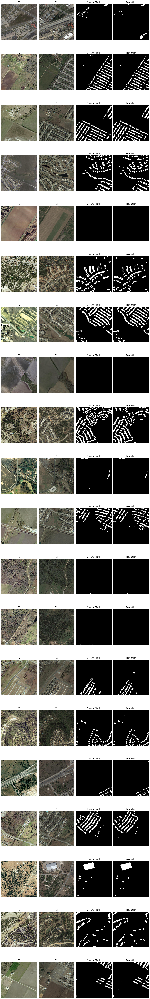

In [ ]:
import matplotlib.pyplot as plt
import random

model = build_seifnet(input_shape=(CFG.PATCH, CFG.PATCH, CFG.CHANNELS))
model.load_weights(os.path.join(CFG.OUT_DIR, 'seifnet_best.h5'))

test_t1 = sorted_files(CFG.TEST_T1_DIR)
test_t2 = sorted_files(CFG.TEST_T2_DIR)
test_gt = sorted_files(CFG.TEST_GT_DIR)
sanity_check_lists(test_t1, test_t2, test_gt)

indices = random.sample(range(len(test_t1)), 20)

plt.figure(figsize=(12, 4 * len(indices)))  

for i, idx in enumerate(indices):
    t1_img = _decode_image(test_t1[idx]).numpy()
    t2_img = _decode_image(test_t2[idx]).numpy()
    gt_img = _decode_mask(test_gt[idx]).numpy()

    pred = model.predict(
        [np.expand_dims(t1_img, 0), np.expand_dims(t2_img, 0)],
        verbose=0
    )[0]
    pred_bin = (pred > CFG.THRESH).astype(np.uint8)

    plt.subplot(len(indices), 4, i * 4 + 1)
    plt.imshow(t1_img)
    plt.title("T1")
    plt.axis("off")

    plt.subplot(len(indices), 4, i * 4 + 2)
    plt.imshow(t2_img)
    plt.title("T2")
    plt.axis("off")

    plt.subplot(len(indices), 4, i * 4 + 3)
    plt.imshow(gt_img[..., 0], cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(len(indices), 4, i * 4 + 4)
    plt.imshow(pred_bin[..., 0], cmap="gray")
    plt.title("Prediction")
    plt.axis("off")

plt.tight_layout()
plt.show()
